# Active Brownian Particles
Modelling simple particles that move with brownian motion and interact with each other.

In [8]:
from abp import *
import time

We will use the equations of motion
 $$\dot{r_i}=v_0\hat{m}+\sum_{i}{F_{ij}}$$
 $$\dot{\theta}=\sqrt{2\pi D_r}\eta(t)$$ 
 to update our particles positions so they move with brownian motion, a close distance repulsion force and a mid distance cohesion force determined by the interaction forces $F_{ij}$. $\eta$ is a uncorrelated and unbiased white noise and $D_r$ is a constant that determines the rate of angular diffusion. To calculate this we will discretise $\eta(t)$ and approximate it $\eta_n =\eta_{n-1}+Y_n$ where $Y_n$ is a normally distributed RV with mean 0 and variance $D_r$. 


In [2]:
abp = ABP(50,k=1,v_0=0.1,R=1,D=0.1,box_width =10,potential=short_scale_repulsion)
abp.generate_csv(100,0.05)

c:\Users\bennm\Documents\UNI\Year 3\Modelling Tissues Project\abp.py:63: RuntimeWarning: invalid value encountered in true_divide
  normalised_arr = np.nan_to_num(arr/np.moveaxis(np.tile(lag.norm(arr,axis=2),(2,1,1)),0,2))


'abp_data__v_0_0.1__box_width_10__D_0.1__N_50__k_1.csv'

In [16]:
##STRESS TESTING

def data_generation_runtime(N,T):
    abp = ABP(N)
    start = time.time()
    r,d,v = abp.generate_movement_data(T,0.05)
    end = time.time()
    return start-end
# Ns = np.array([10,22,48,100,220,480,1000])
Ns = np.array([10,20])
T = 1000
runtime_data = np.zeros(Ns.shape)
for i,n in enumerate(Ns):
    runtime_data[i] = data_generation_runtime(n,T)

c:\Users\bennm\Documents\UNI\Year 3\Modelling Tissues Project\abp.py:63: RuntimeWarning: invalid value encountered in true_divide
  normalised_arr = np.nan_to_num(arr/np.moveaxis(np.tile(lag.norm(arr,axis=2),(2,1,1)),0,2))


ValueError: could not broadcast input array from shape (1000,2) into shape (10,2)

In [11]:
x = np.linspace(0,10,11)

1

c:\Users\bennm\Documents\UNI\Year 3\Modelling Tissues Project\abp.py:63: RuntimeWarning: invalid value encountered in true_divide
  normalised_arr = np.nan_to_num(arr/np.moveaxis(np.tile(lag.norm(arr,axis=2),(2,1,1)),0,2))


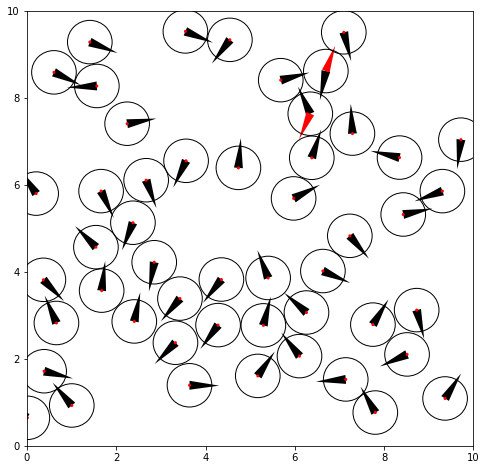

In [3]:
abp = ABP(50,k=1,v_0=0.1,R=1,D=0.1,box_width =10,potential=short_scale_repulsion)
anim = abp.animate_movement_patch(500,0.025)
HTML(anim.to_jshtml())

## Analysis
Phase transistions. 
Below we animate the motion with small radii (relative to box size and velocity) and how they interact with 0 noise, a short distance repulsion force and a high coefficient of restitution (k). We expect the movement of a fluid as this is a medium scale model of how molecules interact in a fluid. 

<ipython-input-2-fe54d5c14d79>:54: RuntimeWarning: invalid value encountered in true_divide
  normalised_arr = np.nan_to_num(arr/np.moveaxis(np.tile(lag.norm(arr,axis=2),(2,1,1)),0,2))


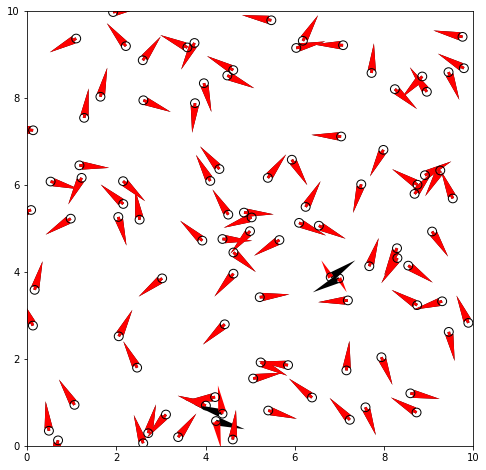

In [5]:
abp = ABP(100,v_0=1,D=0,R=0.2,k=5)
anim = abp.animate_movement_patch(500,0.025)
HTML(anim.to_jshtml())

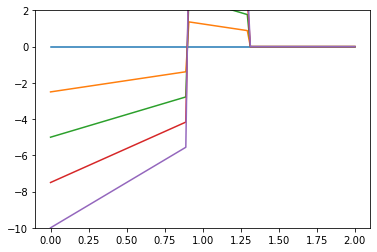

In [15]:
#plotting short_scale_repulsion force
def plot_potential(psi= short_scale_repulsion):
    num_points = 100 
    num_lines = 5
    x = np.linspace(0,2,num_points).reshape(num_points,1)
    y = np.zeros(num_points).reshape(num_points,1)
    coords = np.array([np.append(x,y,axis=1)])
    fs = np.zeros((num_lines,num_points))
    k_vals = np.linspace(0,5,num_lines)
    for i,k in enumerate(k_vals):
        fs[i,:] = psi(coords,1,k=k)[0,:]

    fig,ax = plt.subplots()
    ax.set(ylim=(-10,2))
    for i in range(num_lines):
        plot = ax.plot(x[:,0],fs[i,:])
    return plot 
plot_potential(repulsion_cohesion_potential)

## Mean Squared Dispalcement
Caluclating the mean squared displacement using $$<|x(t)-x(0)|^2>=\frac{1}{N}\sum_1^{N}{|x_i(t)-x_i(0)|^2}$$


c:\Users\bennm\Documents\UNI\Year 3\Modelling Tissues Project\abp.py:61: RuntimeWarning: invalid value encountered in true_divide
  normalised_arr = np.nan_to_num(arr/np.moveaxis(np.tile(lag.norm(arr,axis=2),(2,1,1)),0,2))


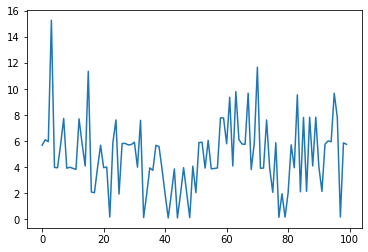

In [7]:
abp = ABP(N=50,v_0=0.1,R=1,D=0.1,box_width=10)
msd_data = abp.generate_msd_data(100,0.025,5)
plt.plot(msd_data)

# Varying Parameters
Here we will investigate qualitatively the effect of varying the parameters v_0, k and D on a fully tiled box of 196 particles with the same intial pseudo random angles theta. 

In [6]:
## generating samples of parameter space to animate and compare behaviour

num_samples = 3
v_low,v_high = (0.1,0.5)
D_low,D_high = (0,1)
k_low,k_high = (0.1,0.5)
v_range = np.linspace(v_low,v_high,num_samples)
D_range = np.linspace(D_low,D_high,num_samples)
k_range = np.linspace(k_low,k_high,num_samples)

parameter_matrix = np.zeros((np.repeat(num_samples,4)))
for i in range(num_samples):
    for j in range(num_samples):
        for k in range(num_samples):
            parameter_matrix[i,j,k,:] = [v_range[i],D_range[j],k_range[k]]
parameter_matrix = parameter_matrix.round(2)
p_dicts = [{"v_0":x[0],"D":x[1],"k":x[2]} for x in parameter_matrix.reshape(num_samples**3,3)]


def get_parameter_suffix(p_dict):
    keys = "_".join([str(i) for i in p_dict.keys()])
    values = "_".join([str(i) for i in p_dict.values()])
    out = keys+"__" +values
    return out

# p_dicts[0].values()
# for p_dict in p_dicts:
#     print(get_parameter_suffix(p_dict))


In [30]:
N =5 
T = 10
abp = ABP(N)
r_data,v_data,d_data = abp.generate_movement_data(T,0.05)
flattened_r_data = r_data.reshape((T+1)*N,2)
pd.DataFrame(flattened_r_data,columns=["x data","y data"])

c:\Users\bennm\Documents\UNI\Year 3\Modelling Tissues Project\abp.py:63: RuntimeWarning: invalid value encountered in true_divide
  normalised_arr = np.nan_to_num(arr/np.moveaxis(np.tile(lag.norm(arr,axis=2),(2,1,1)),0,2))


,x data,y data
0,3.219313,4.365224
1,0.730498,6.542622
2,1.916770,8.414334
3,5.970190,2.645263
4,6.959655,0.251378
5,3.214662,4.363389
6,0.727995,6.546951
7,1.919181,8.409953
8,5.973766,2.641768
9,6.963488,0.254589
